#### Abstract:

- Predict maximum and minimum temperature with the given information

### Import the dataset and libraries 

In [2]:
# import the libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# import warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
# create the dataframe
temp = pd.read_csv("temp.csv")

In [4]:
# check the first 5 records
temp.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


 #### The dataset is a collective combination of categorical and numerical variables 


#### The columns and thier descriptions

1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

##### Please note that there are two target variables here: 

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature



In [5]:
# check the shape of the column
temp.shape

(7752, 25)

#### There are 7752 records and 25 columns

In [6]:
#check the name of the columns
temp.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

# Identifying the problem : Regression

In [7]:
# chech the type of data
temp.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

#### Changing the date column to datetime type

In [8]:
temp['Date'] = pd.to_datetime(temp['Date'])

In [9]:
#check the type
temp['Date'].dtypes

dtype('<M8[ns]')

In [10]:
#check the date column
temp["Date"]

0      2013-06-30
1      2013-06-30
2      2013-06-30
3      2013-06-30
4      2013-06-30
          ...    
7747   2017-08-30
7748   2017-08-30
7749   2017-08-30
7750          NaT
7751          NaT
Name: Date, Length: 7752, dtype: datetime64[ns]

In [11]:
# check one sample from the dataframe
temp.sample()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
3020,21.0,2014-08-27,27.6,21.6,44.352077,70.468521,29.552519,21.217548,6.305846,13.518873,...,0.0,0.0,0.0,37.5507,127.04,26.298,0.5721,4573.437012,30.2,20.7


#### Regression/supervised learning
 - The two target columns are of numeric type and they can be predicted with regression model 

# Exploratory Data Analysis and Data Cleaning

In [12]:
# pair plot to analyse the distribution and trend in data
sns.pairplot(temp)

#### Multivariate analysis

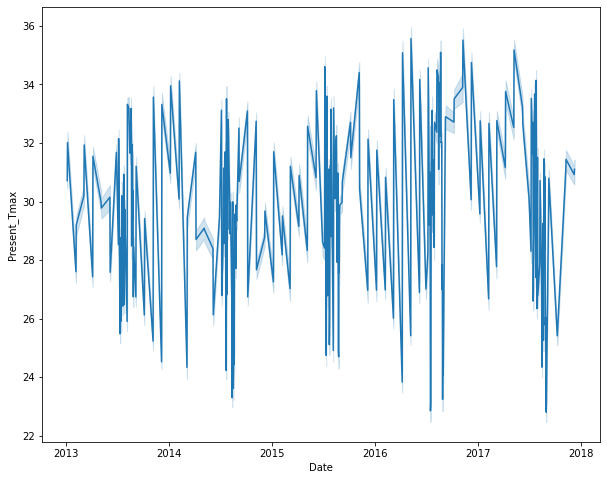

In [13]:
# line plot with respect to date
fig_size = (10,8)
fig, ax = plt.subplots(figsize = fig_size)
sns.lineplot(data=temp, x="Date", y="Present_Tmax")

### Observation:
- The maximum temperature is quite stable with no high peak or low peak. It is in-between 23 to 34 degrees

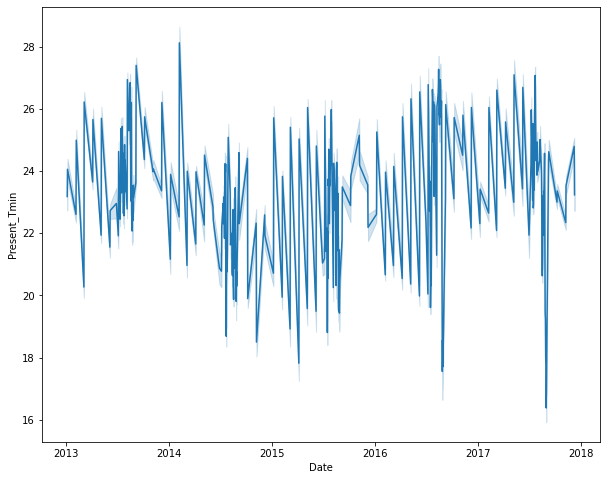

In [15]:
fig_size = (10,8)
fig, ax = plt.subplots(figsize = fig_size)
sns.lineplot(data=temp, x="Date", y="Present_Tmin")

### Observation:

- The minimum temperature is had reached the lowest temperature in between 2017 to 2018, Mostly the minimun temperature lies at 24 degree.

#### Using for loop to create multiple plot 

In [14]:
column = ['station', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin']


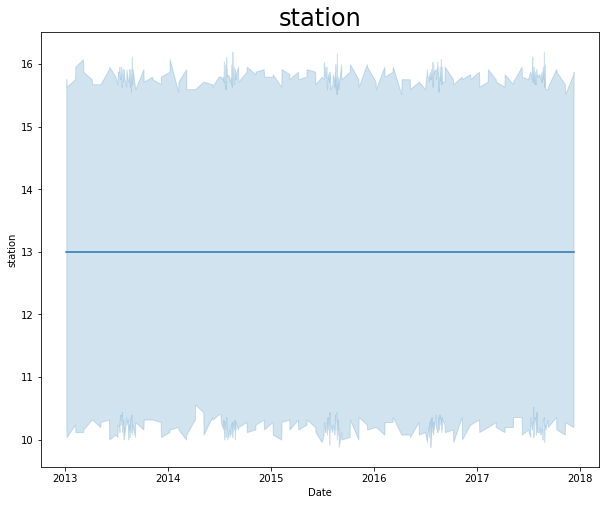

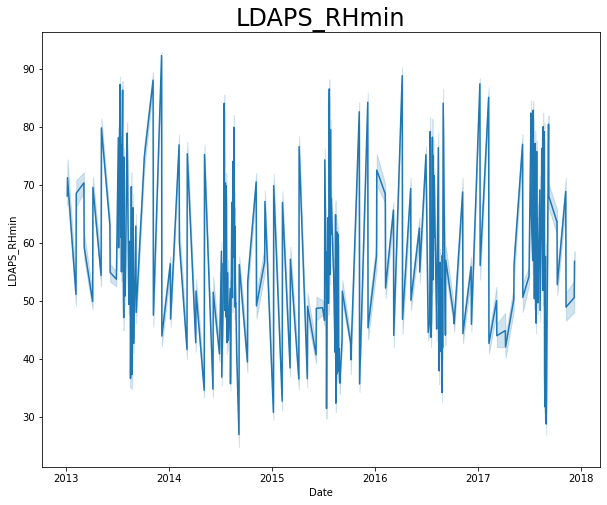

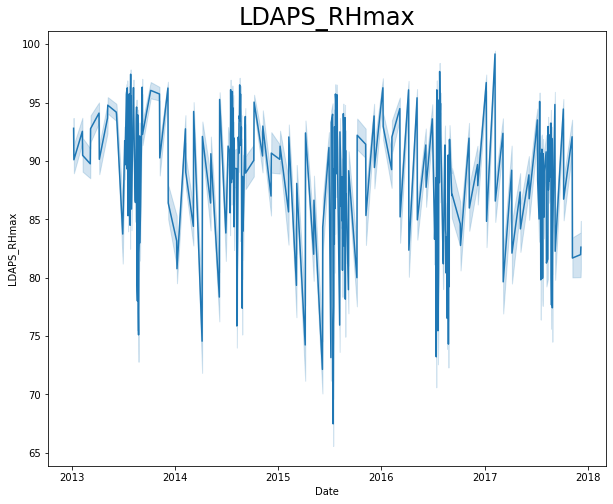

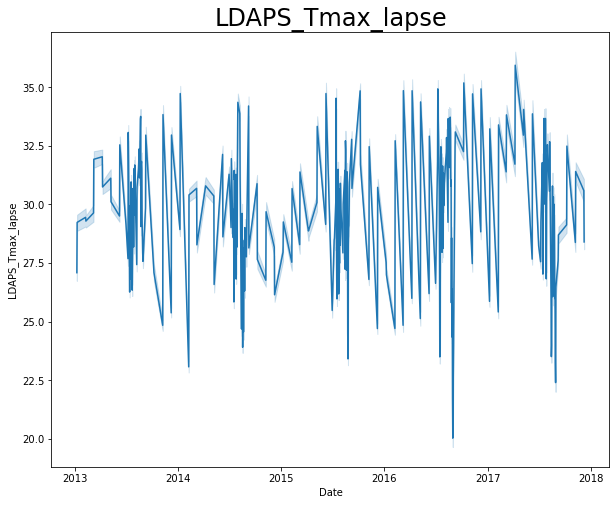

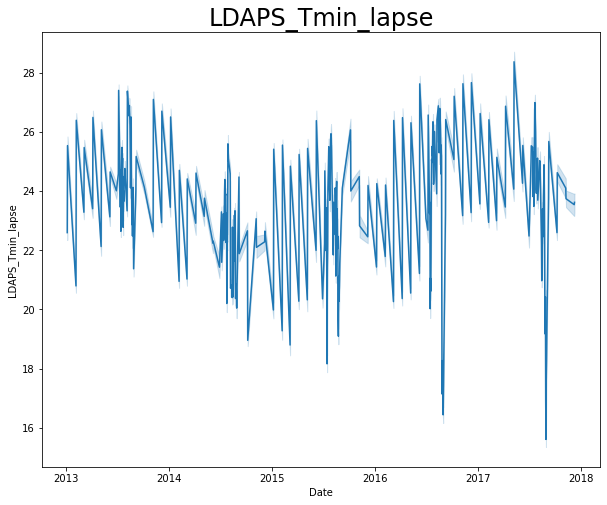

...

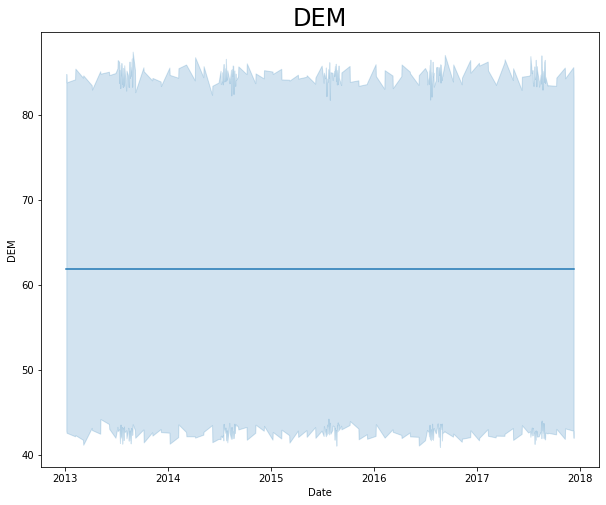

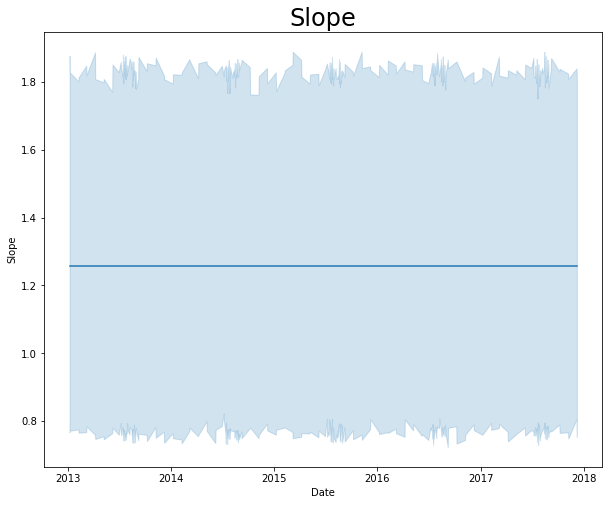

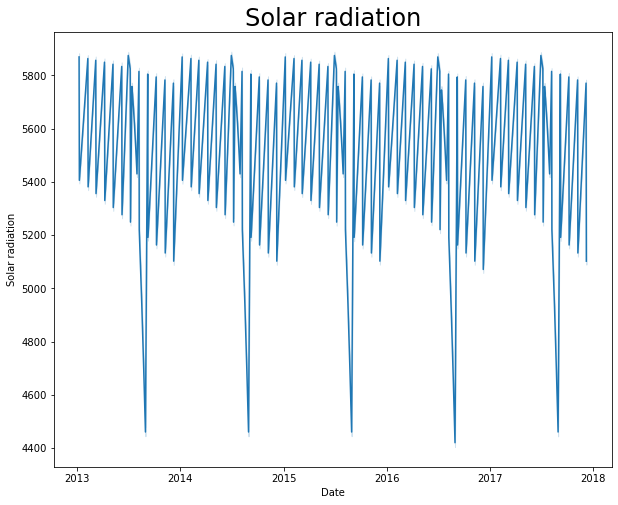

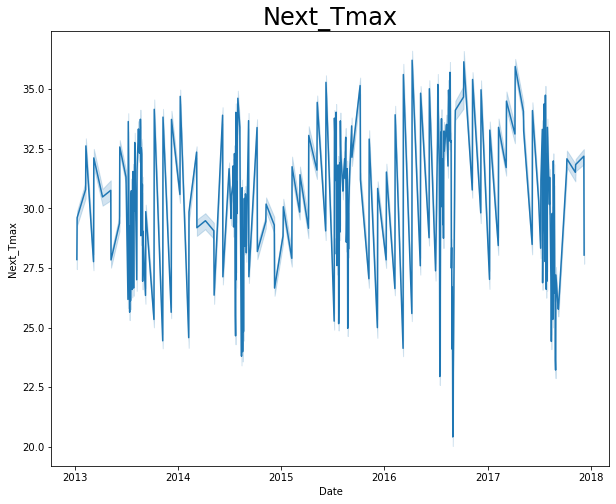

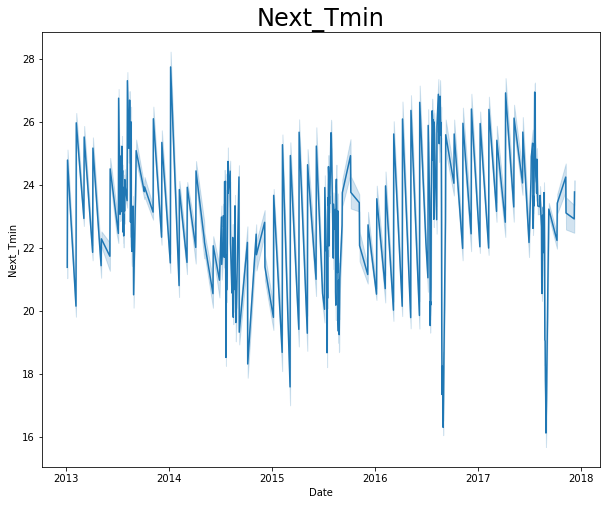

In [17]:
for x in column:
    fig_size = (10,8)
    fig, ax = plt.subplots(figsize = fig_size)
    plt.title(x, fontsize=24)
    sns.lineplot(data=temp, x="Date", y=x)

### Observation:

1. station :
    - The station column is a discrete variable and it is not related with the date
    
2. LDAPS_RHmin :
    - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
    - The min relative humidity lies with in the limit over the given years
    
3. LDAPS_RHmax:
    - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
    - The maximum relative humidity lies with in the limit over the given years
    
4. LDAPS_Tmax_lapse:
    - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
    - maximum air temperature lies with in the limit over the given years
    
5. LDAPS_Tmin_lapse:
    - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
    - minimum air temperature lies with in the limit over the given years
    
6. LDAPS_WS:
    - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
    - next-day average wind speed lies with in the limit over the given years
    
7. LDAPS_LH:
    - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
    - next-day average latent heat fluxlies with in the limit over the given years

8. LDAPS_CC1:
    - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
    - 1st 6-hour split average cloud cover lies with in the limit over the given years
    
9. LDAPS_CC2:
    - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
    - 2nd 6-hour split average cloud cover (6-11 h) lies with in the limit over the given years
    
10. LDAPS_CC3:
    - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
    - 3rd 6-hour split average cloud cover (12-17 h) lies with in the limit over the given years
    
11. LDAPS_CC4:
    - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
    - 4th 6-hour split average cloud cover (18-23 h) lies with in the limit over the given years
  
 
12. LDAPS_PPT1:
    - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
    - 1st 6-hour split average precipitation  has occational stiff rise in percipitation over the given years.
13. LDAPS_PPT2:
    - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
    - 2nd 6-hour split average precipitation has occational stiff rise in percipitation over the given years.
        
14. LDAPS_PPT3:
    - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
    -  3rd 6-hour split average precipitation has occational stiff rise in percipitation over the given years.
        
15. LDAPS_PPT4:
    -  LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
    - 4th 6-hour split average precipitation (18-23 h) has occational stiff rise in percipitation over the given years
    
16. lat:
    - Latitude (Â°): 37.456 to 37.645
    - The lat column as no trend with  date
17. lon:
    - Longitude (Â°): 126.826 to 127.135
    - The lon column as no trend with  date
18. DEM:
    - Elevation (m): 12.4 to 212.3
    - The DEM column as no trend with  date
19. Slope:
    - Slope (Â°): 0.1 to 5.2
    - The slope column as no trend with  date
20. Solar radiation:
    - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
    - The solar radition drops at some point every year but lies within the limit
21. Next_Tmax:
    - The next-day maximum air temperature (Â°C): 17.4 to 38.9
    - next-day maximum air temperature lies within the limit over the given years.
22. Next_Tmin:
    - The next-day minimum air temperature (Â°C): 11.3 to 29.8T
    - next-day minimum air temperature  within the limit over the given years.
    

### Using loop for scatter plot

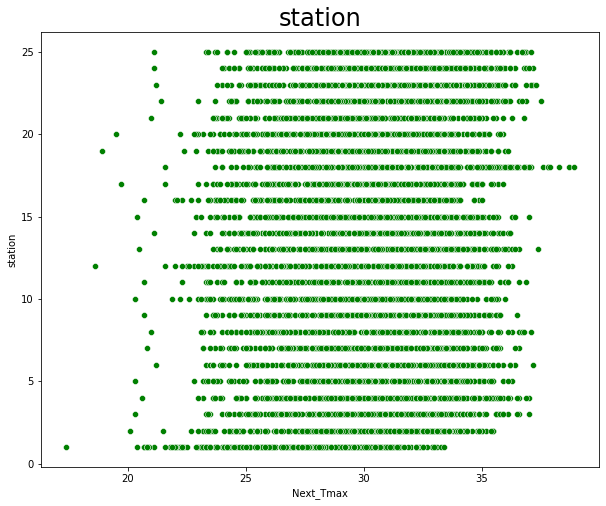

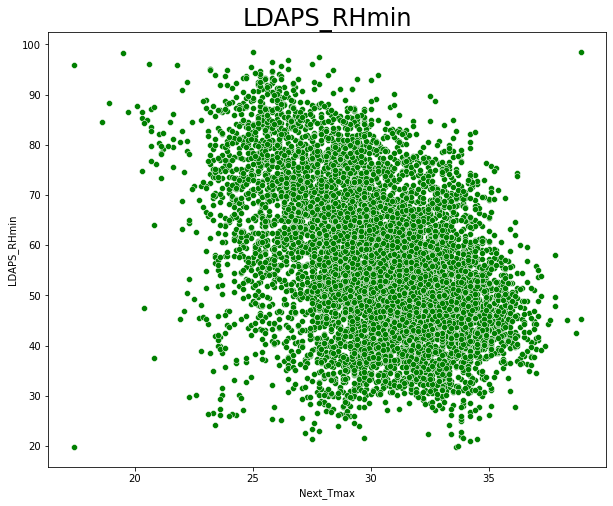

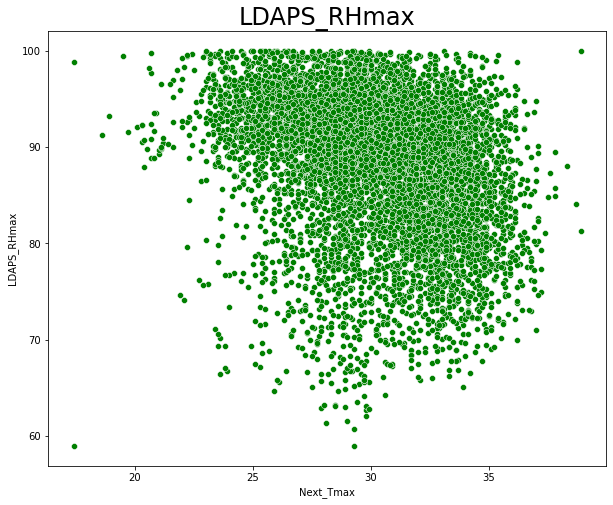

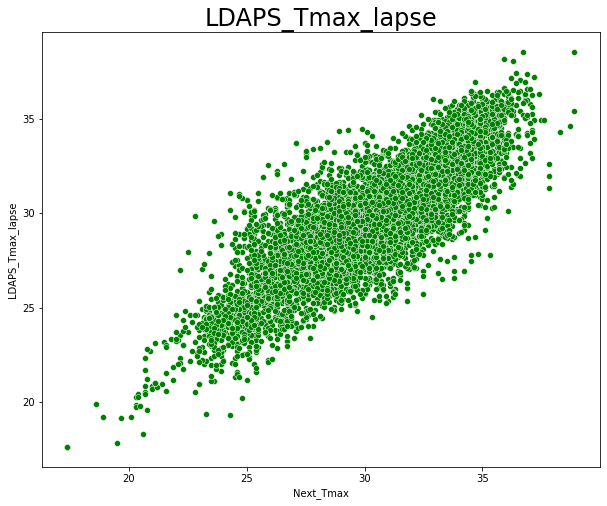

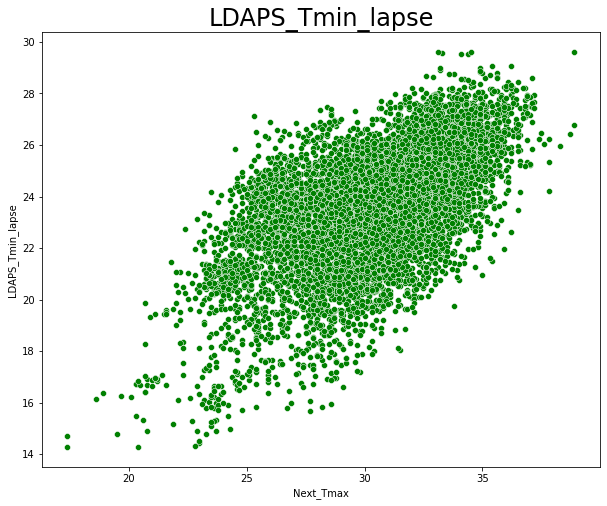

...

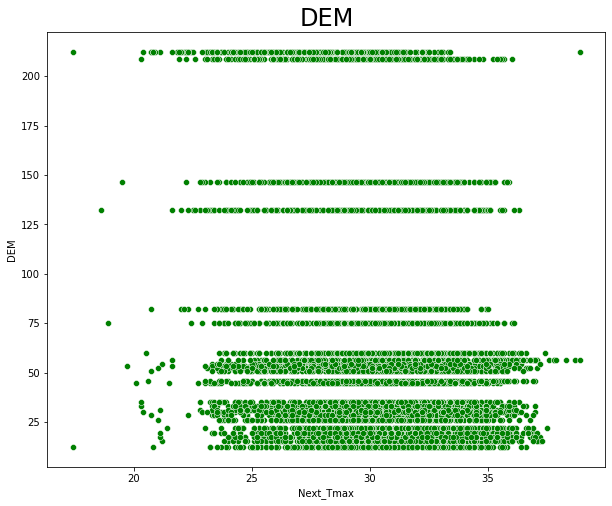

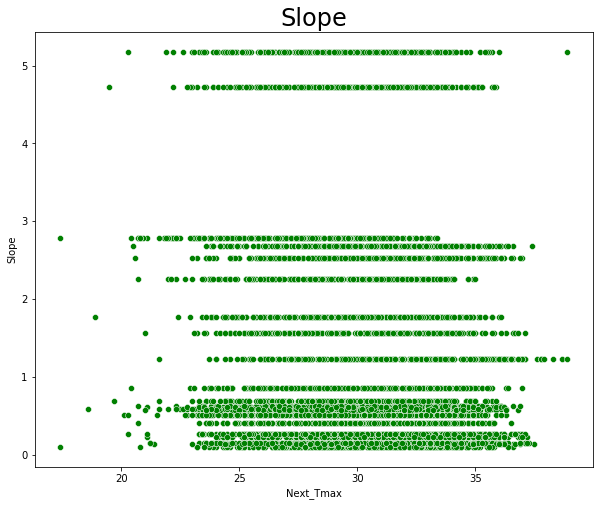

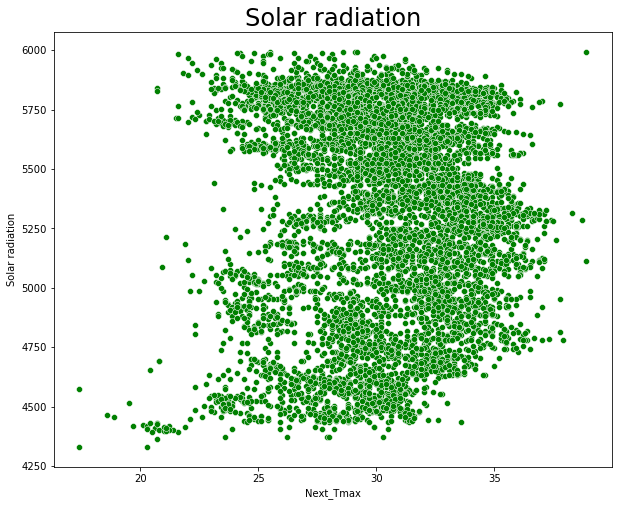

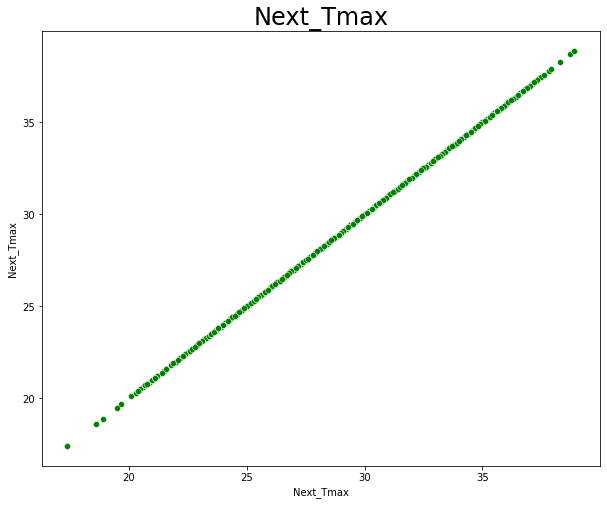

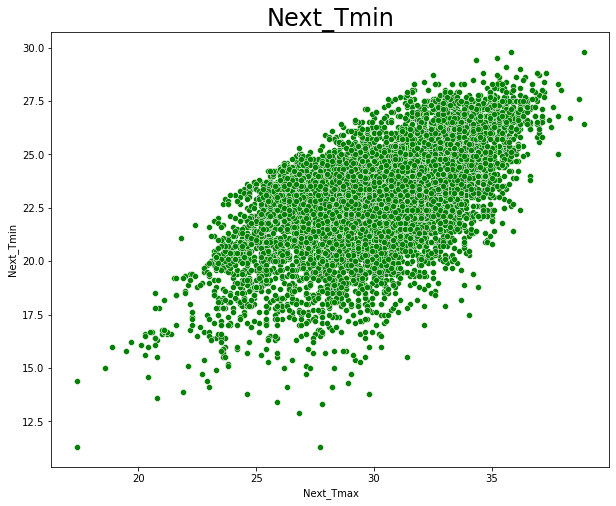

In [16]:
for x in column:
    fig_size = (10,8)
    fig, ax = plt.subplots(figsize = fig_size)
    plt.title(x, fontsize=24)
    sns.scatterplot(data=temp, x="Next_Tmax", y=x, color = 'g')

#### Observations:

2. LDAPS_RHmin :
    - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
    - weak / no relationship
    
3. LDAPS_RHmax:
    - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
    - weak / no relationship
    
4. LDAPS_Tmax_lapse:
    - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
    - positive linear relationship with tmax
    
5. LDAPS_Tmin_lapse:
    - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
    - positive linear relationship with tmax
    
6. LDAPS_WS:
    - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
    - weak / no relationship

7. LDAPS_LH:
    - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
    - weak / no relationship

8. LDAPS_CC1:
    - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
    - negative linear relationship with tmax
    
9. LDAPS_CC2:
    - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
    - negative linear relationship with tmax
    
10. LDAPS_CC3:
    - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
    - negative linear relationship with tmax
    
11. LDAPS_CC4:
    - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
    - Negative linear relationship with tmax
  
 
12. LDAPS_PPT1:
    - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
    - scattered at the lower level, weak relationship
    
13. LDAPS_PPT2:
    - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
    - scattered at the lower level, weak relationship
        
14. LDAPS_PPT3:
    - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
    -  scattered at the lower level, weak relationship
        
15. LDAPS_PPT4:
    -  LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
    - scattered at the lower level, weak relationship
    

20. Solar radiation:
    - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
    - scattered without direction, weak or no relationship
    
21. Next_Tmin:
    - The next-day minimum air temperature (Â°C): 11.3 to 29.8T
    - Positive linear relationship with tmax
    

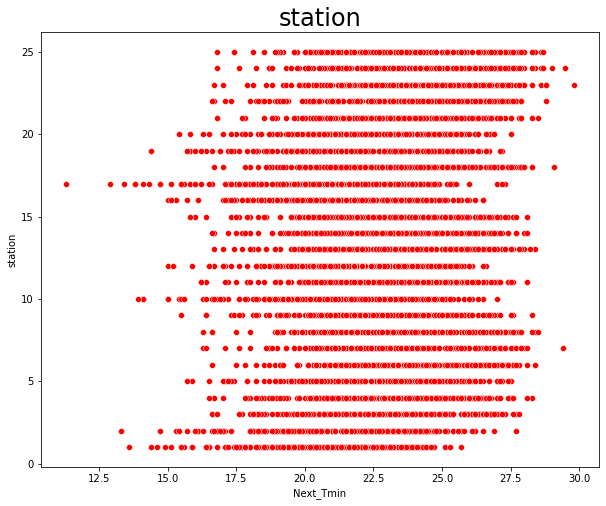

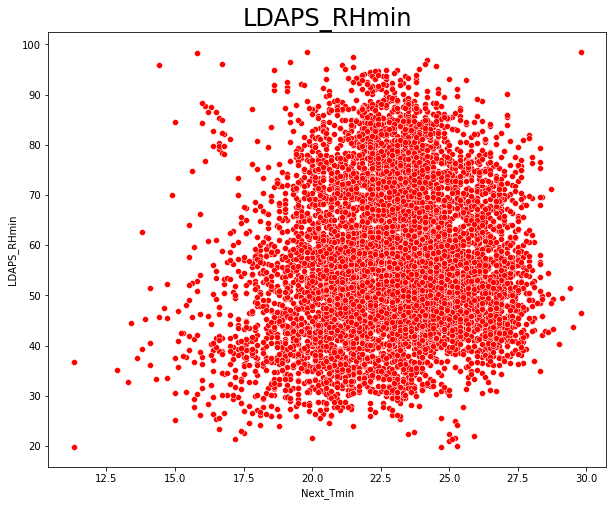

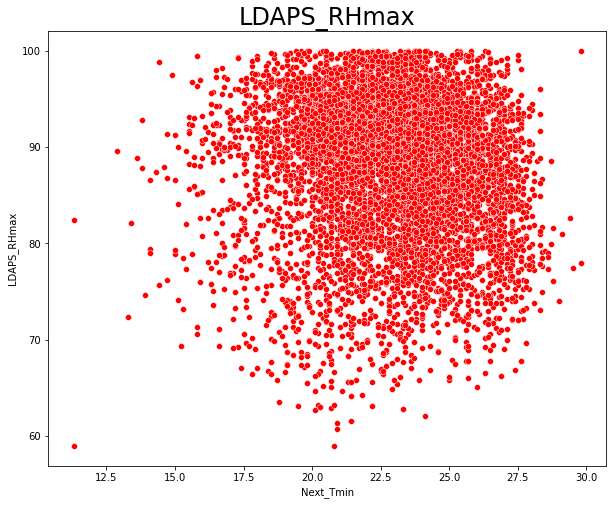

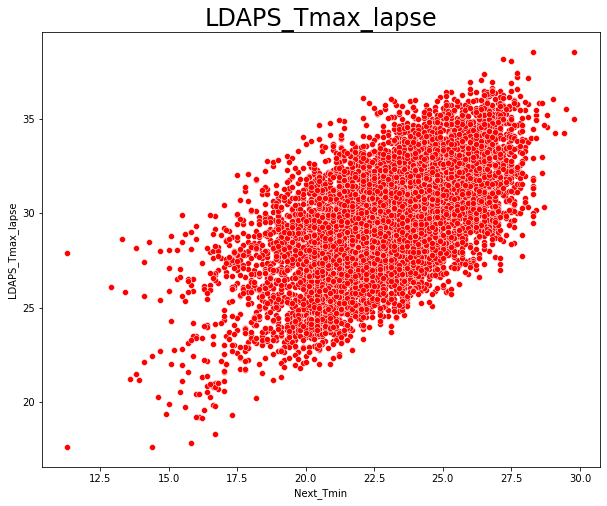

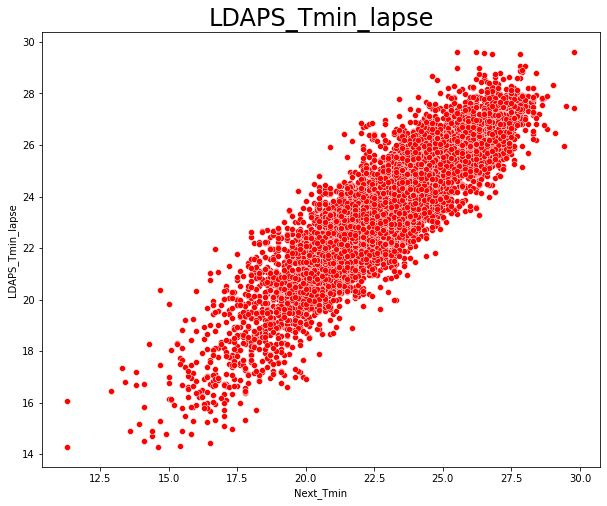

...

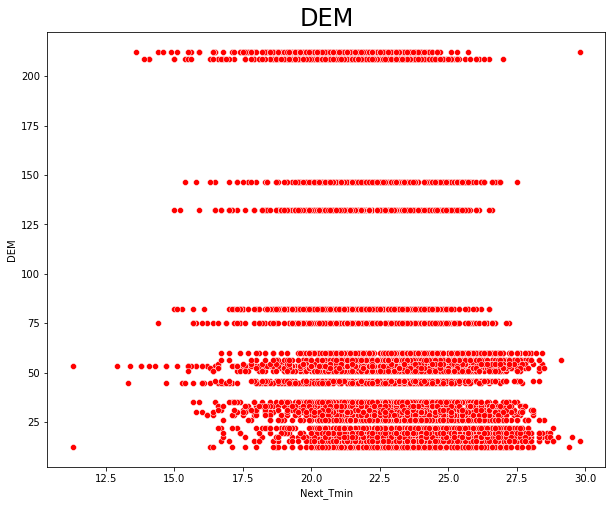

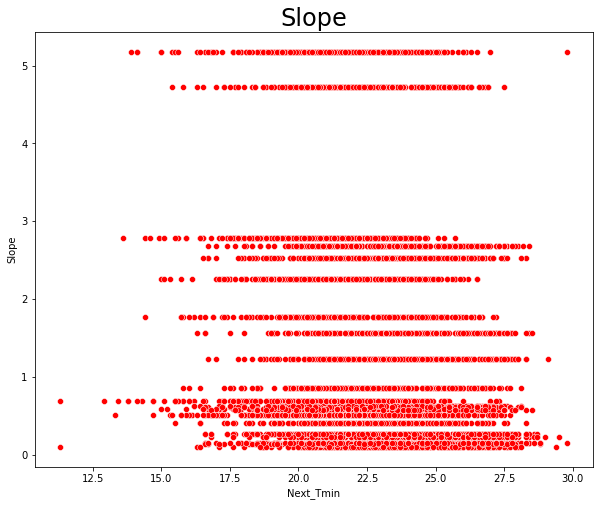

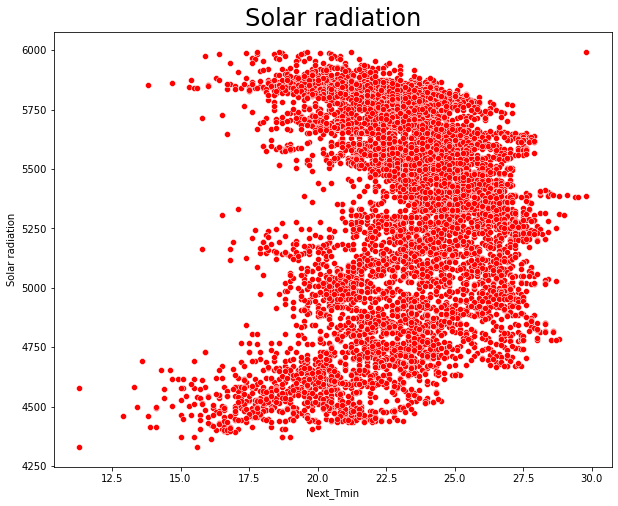

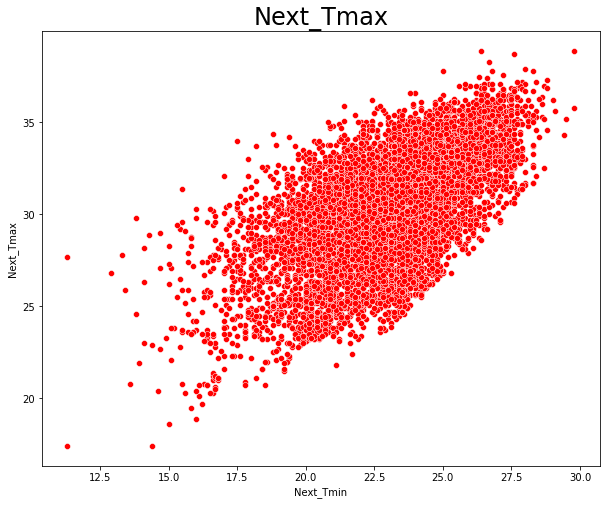

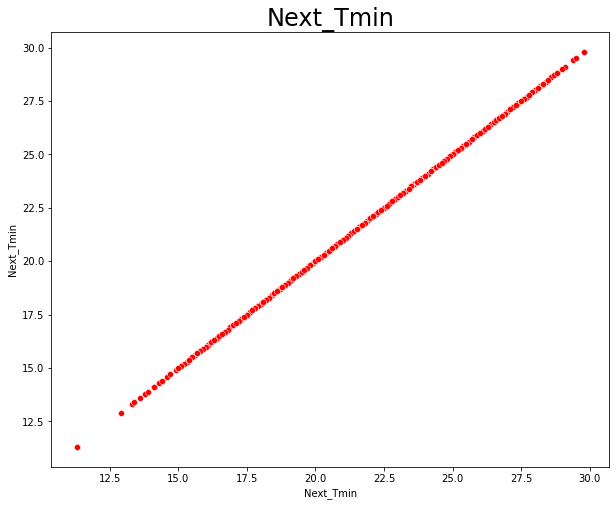

In [19]:
for x in column:
    fig_size = (10,8)
    fig, ax = plt.subplots(figsize = fig_size)
    plt.title(x, fontsize=24)
    sns.scatterplot(data=temp, x="Next_Tmin", y=x, color = 'r')

#### Observations:

2. LDAPS_RHmin :
    - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
    - weak / no relationship
    
3. LDAPS_RHmax:
    - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
    - weak / no relationship
    
4. LDAPS_Tmax_lapse:
    - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
    - positive linear relationship with tmin
    
5. LDAPS_Tmin_lapse:
    - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
    - positive linear relationship with tmin
    
6. LDAPS_WS:
    - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
    - weak / no relationship

7. LDAPS_LH:
    - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
    - weak / no relationship

8. LDAPS_CC1:
    - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
    -  weak / no relationship
    
9. LDAPS_CC2:
    - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
    -  weak / no relationship
    
10. LDAPS_CC3:
    - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
    -  weak / no relationship
    
11. LDAPS_CC4:
    - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
    -  weak / no relationship

 
12. LDAPS_PPT1:
    - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
    - scattered at the lower level, weak relationship
    
13. LDAPS_PPT2:
    - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
    - scattered at the lower level, weak relationship
        
14. LDAPS_PPT3:
    - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
    -  scattered at the lower level, weak relationship
        
15. LDAPS_PPT4:
    -  LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
    - scattered at the lower level, weak relationship
    

20. Solar radiation:
    - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
    - scattered without direction, weak or no relationship
    
21. Next_Tmin:
    - The next-day minimum air temperature (Â°C): 11.3 to 29.8T
    - Positive linear relationship with tmin
    

### Bivariate analysis

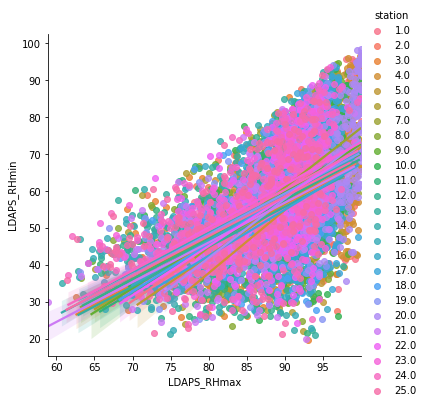

In [20]:
sns.lmplot(x="LDAPS_RHmax", y='LDAPS_RHmin',  hue="station", data=temp)

#### POSITIVE LINEAR RELATIONSHIP BETWEEN RHMAX AND RHMIN 

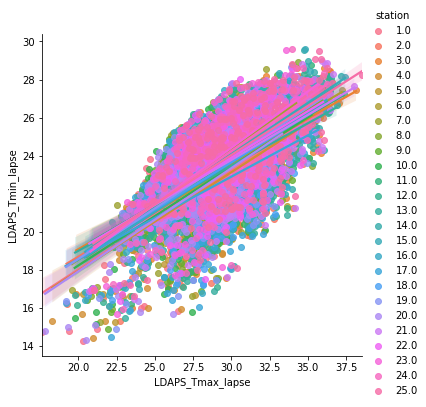

In [21]:
sns.lmplot(x="LDAPS_Tmax_lapse", y='LDAPS_Tmin_lapse',  hue="station", data=temp)

#### POSITIVE LINEAR RELATIONSHIP BETWEEN TMIN_LAPSE AND TMAX_LAPSE

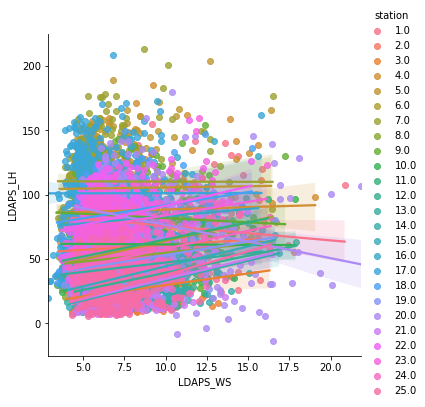

In [22]:
sns.lmplot(x="LDAPS_WS", y='LDAPS_LH',  hue="station", data=temp)

#### WEAK OR NO RELATIONSHIP BETWEEN LH AND WS

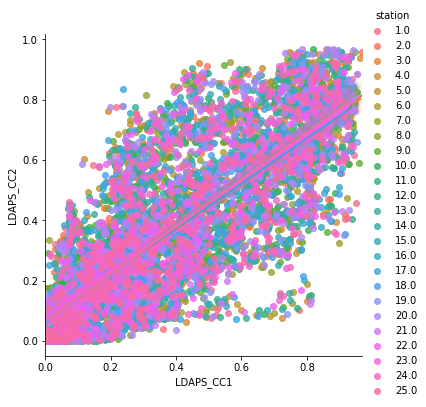

In [23]:
sns.lmplot(x="LDAPS_CC1", y='LDAPS_CC2',  hue="station", data=temp)

#### POSITIVE LINEAR RELATIONSHIP BETWEEN CC2 AND CC1

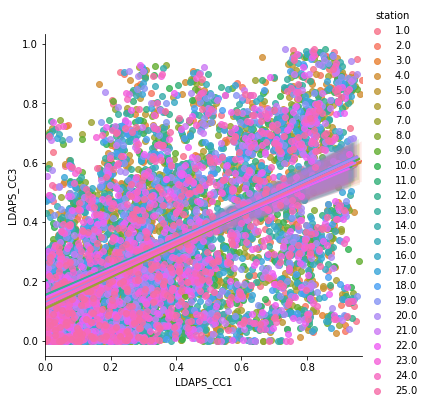

In [24]:
sns.lmplot(x="LDAPS_CC1", y='LDAPS_CC3',  hue="station", data=temp)

#### WEEK OR NO RELATIONSHIP BETWEEN CCS AND CC1

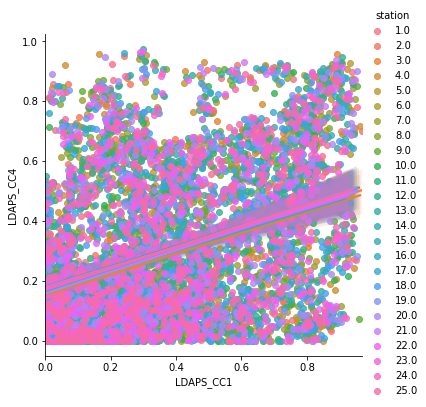

In [25]:
sns.lmplot(x="LDAPS_CC1", y='LDAPS_CC4',  hue="station", data=temp)

####  WEEK OR NO RELATIONSHIP BETWEEN CC4 AND CC1

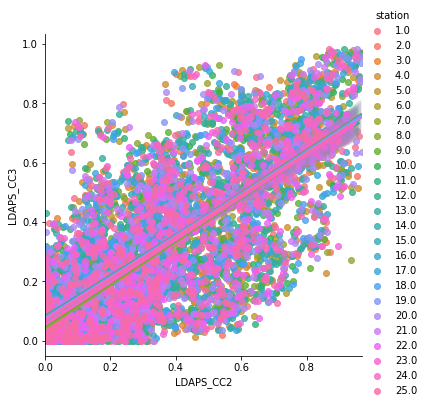

In [26]:
sns.lmplot(x="LDAPS_CC2", y='LDAPS_CC3',  hue="station", data=temp)

### POSITVE LINEAR RELATIONSHIP BETWEEN CC3 AND CC2

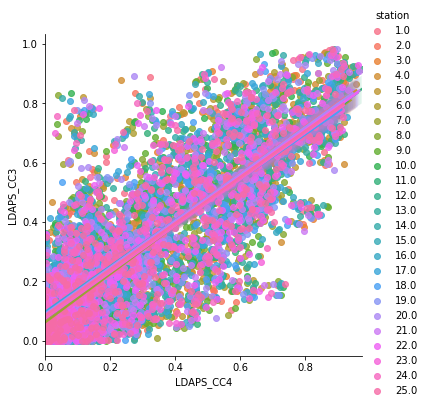

In [27]:
sns.lmplot(x="LDAPS_CC4", y='LDAPS_CC3',  hue="station", data=temp)

#### POSITIVE LINEAR RELATIONSHIP BETWEEN CC3 AND CC4

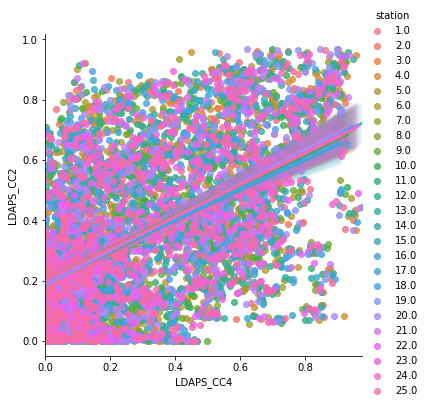

In [28]:
sns.lmplot(x="LDAPS_CC4", y='LDAPS_CC2',  hue="station", data=temp)

#####  NO OR WEAK RELATIONSHIP BETWEEN CC4 AND CC2

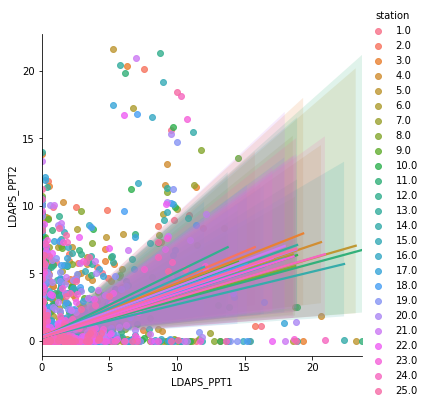

In [30]:
sns.lmplot(x="LDAPS_PPT1", y='LDAPS_PPT2',  hue="station", data=temp)

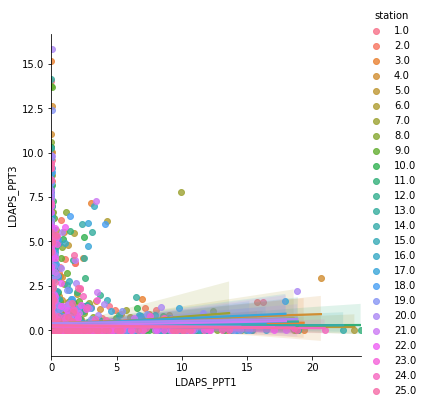

In [31]:
sns.lmplot(x="LDAPS_PPT1", y='LDAPS_PPT3',  hue="station", data=temp)

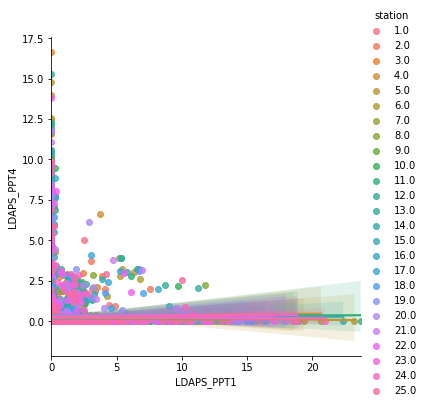

In [32]:
sns.lmplot(x="LDAPS_PPT1", y='LDAPS_PPT4',  hue="station", data=temp)

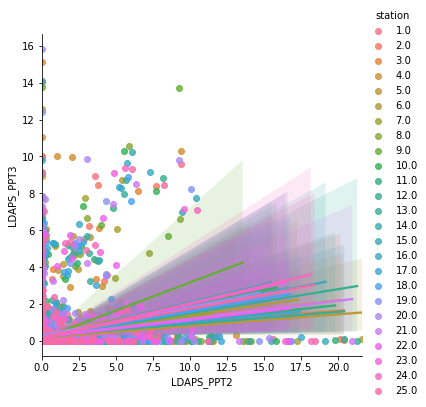

In [33]:
sns.lmplot(x="LDAPS_PPT2", y='LDAPS_PPT3',  hue="station", data=temp)

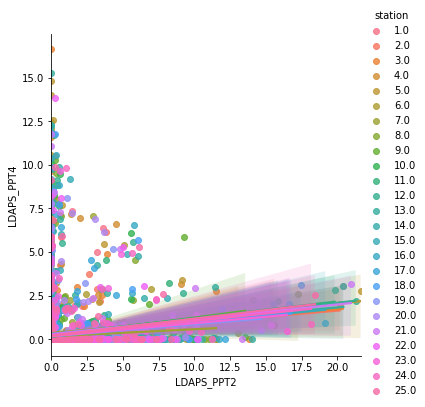

In [34]:
sns.lmplot(x="LDAPS_PPT2", y='LDAPS_PPT4',  hue="station", data=temp)

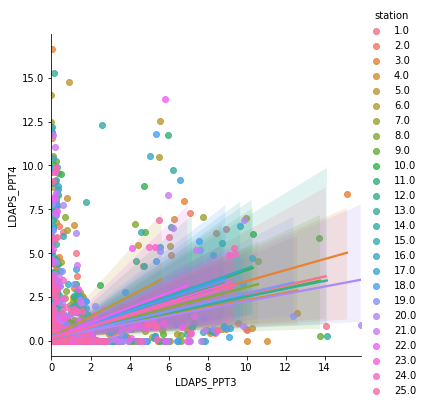

In [35]:
sns.lmplot(x="LDAPS_PPT3", y='LDAPS_PPT4',  hue="station", data=temp)

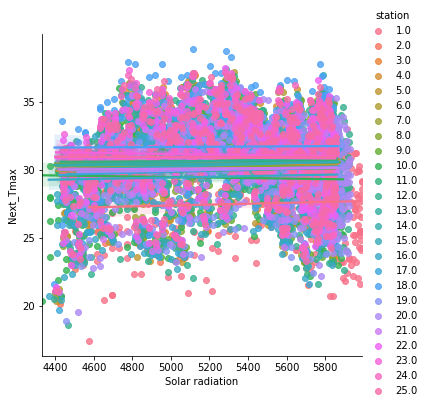

In [36]:
sns.lmplot(x="Solar radiation", y='Next_Tmax',  hue="station", data=temp)

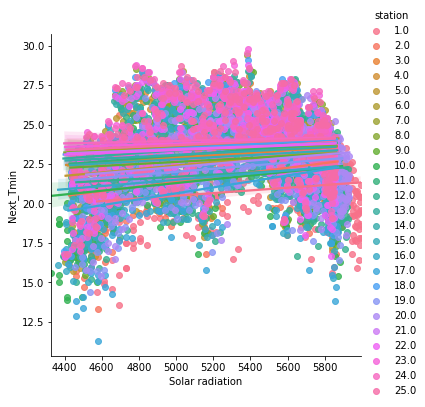

In [37]:
sns.lmplot(x="Solar radiation", y='Next_Tmin',  hue="station", data=temp)

### Correlation Check

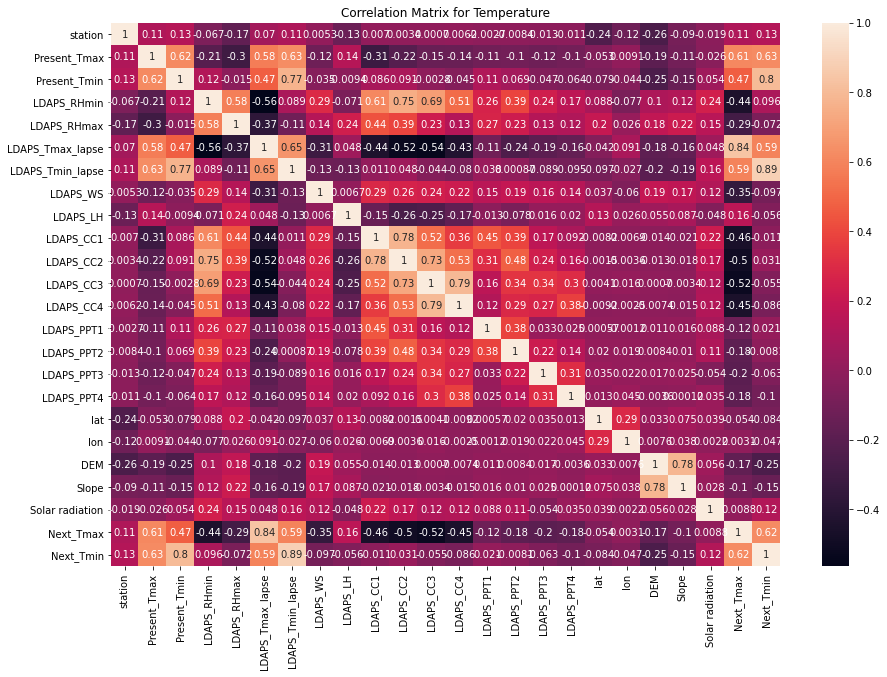

In [38]:
#correlation matrix to find correlation amoung the columns
correlation = temp.corr()
plt.figure(figsize = [15,10])
sns.heatmap(correlation, annot=True)
plt.title("Correlation Matrix for Temperature")
plt.show()

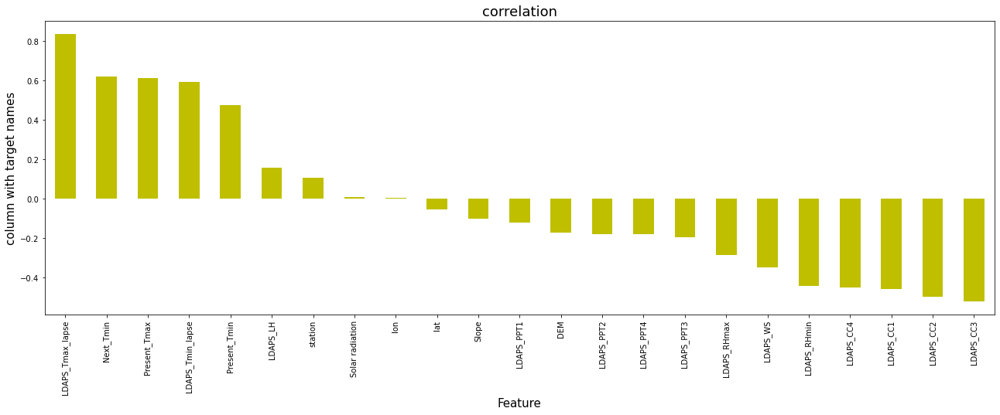

In [39]:
#Arrange feature according to correlation to target variables.
plt.figure(figsize=(22,7))
temp.corr()['Next_Tmax'].sort_values(ascending = False).drop(['Next_Tmax']).plot(kind = "bar", color = "y")
plt.xlabel("Feature", fontsize = 15)
plt.ylabel("column with target names", fontsize = 15)
plt.title("correlation", fontsize=18)
plt.show()

### Observation:
- lot, and solar radiation are poorly correlated with tmax
- Other variables show strong positive and negative correlations with the target variables 

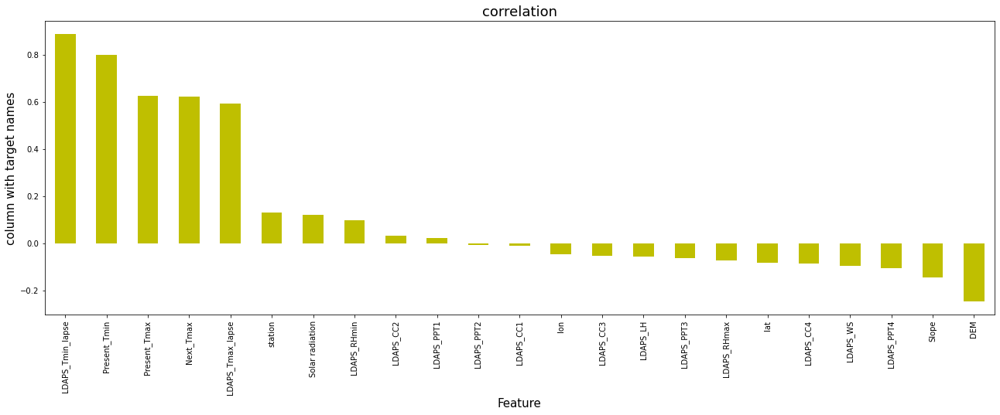

In [40]:
#Arrange feature according to correlation to target variables.
plt.figure(figsize=(22,7))
temp.corr()['Next_Tmin'].sort_values(ascending = False).drop(["Next_Tmin"]).plot(kind = "bar", color = "y")
plt.xlabel("Feature", fontsize = 15)
plt.ylabel("column with target names", fontsize = 15)
plt.title("correlation", fontsize=18)
plt.show()

### Observation:
- LDAPS_PP1, LDAPS_PP2, LDAPS_CCC2 are poorly correlated with tmIN
- Other variables show strong OR weak positive and negative correlations with the target variables 

In [41]:
correlation['Next_Tmax'].sort_values(ascending= False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.836144
Next_Tmin           0.621427
Present_Tmax        0.613109
LDAPS_Tmin_lapse    0.593195
Present_Tmin        0.473868
LDAPS_LH            0.159324
station             0.108306
Solar radiation     0.008809
lon                 0.003060
lat                -0.053567
Slope              -0.102838
LDAPS_PPT1         -0.120079
DEM                -0.172674
LDAPS_PPT2         -0.180449
LDAPS_PPT4         -0.180669
LDAPS_PPT3         -0.196845
LDAPS_RHmax        -0.286478
LDAPS_WS           -0.346592
LDAPS_RHmin        -0.442958
LDAPS_CC4          -0.451324
LDAPS_CC1          -0.457583
LDAPS_CC2          -0.496251
LDAPS_CC3          -0.520706
Name: Next_Tmax, dtype: float64

In [42]:
correlation['Next_Tmin'].sort_values(ascending= False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.886964
Present_Tmin        0.799758
Present_Tmax        0.625252
Next_Tmax           0.621427
LDAPS_Tmax_lapse    0.591535
station             0.128719
Solar radiation     0.120400
LDAPS_RHmin         0.095830
LDAPS_CC2           0.031500
LDAPS_PPT1          0.021486
LDAPS_PPT2         -0.008131
LDAPS_CC1          -0.011129
lon                -0.046737
LDAPS_CC3          -0.055217
LDAPS_LH           -0.055895
LDAPS_PPT3         -0.063318
LDAPS_RHmax        -0.072490
lat                -0.083621
LDAPS_CC4          -0.085805
LDAPS_WS           -0.097390
LDAPS_PPT4         -0.104515
Slope              -0.147043
DEM                -0.247100
Name: Next_Tmin, dtype: float64

### Data Cleaning

##### Checking for null values

In [43]:
#null values
temp.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [44]:
# check for null values
temp.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

##### replacing null values using simple imputer

In [45]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(strategy = "median")
col = ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'Next_Tmax', 'Next_Tmin']


In [46]:
for x in col:
    temp[x] = imp.fit_transform(temp[x].values.reshape(-1,1))

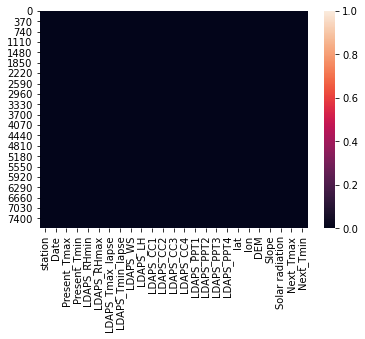

In [47]:
sns.heatmap(temp.isnull())

In [48]:
temp.isnull().sum()

station             2
Date                2
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [49]:
temp.dropna(subset=["station", "Date"], inplace=True)

In [50]:
temp.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [51]:
temp.shape


(7750, 25)

### Null values are removed

### Check for skewness and removal

In [52]:
# date time covertion to ordinal
import datetime as dt
temp["Date"]  =temp["Date"].map(dt.datetime.toordinal)

###### ploting hist plot check for normal distribution

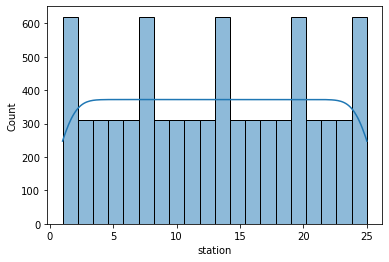

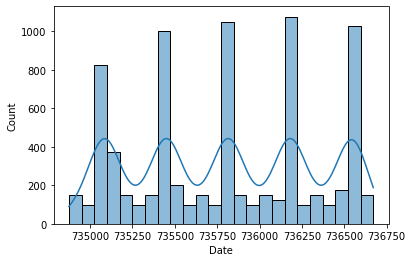

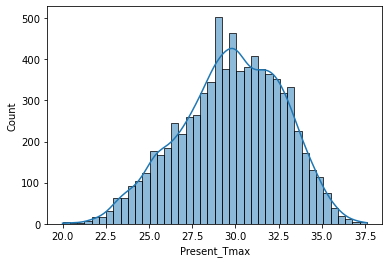

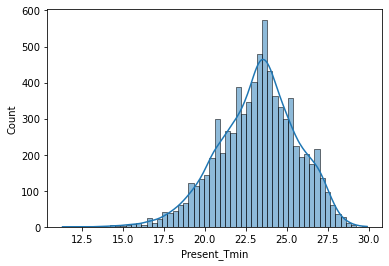

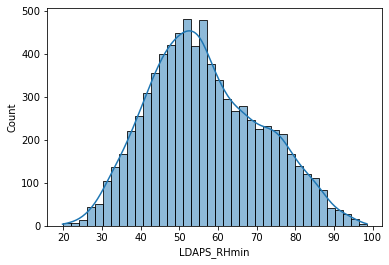

...

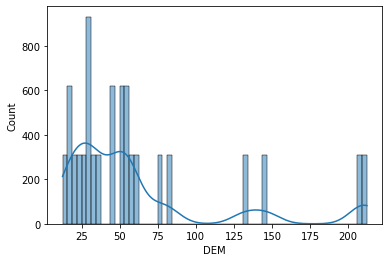

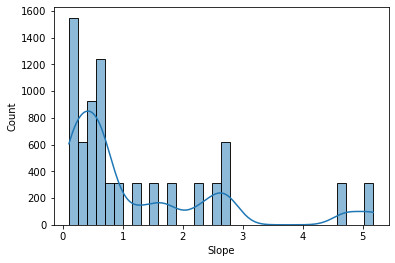

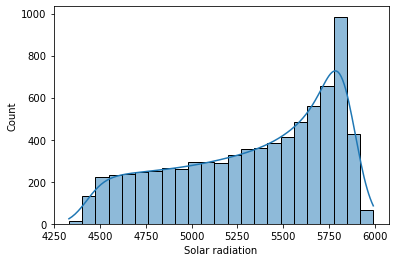

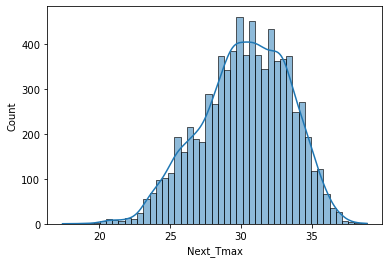

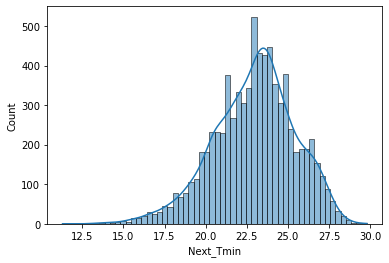

In [53]:
for val in temp.columns:
    sns.histplot(data=temp, x = val, kde=True)
    plt.show()

In [54]:
temp.skew()

station             0.000000
Date               -0.001680
Present_Tmax       -0.264215
Present_Tmin       -0.359513
LDAPS_RHmin         0.303578
LDAPS_RHmax        -0.855863
LDAPS_Tmax_lapse   -0.225096
LDAPS_Tmin_lapse   -0.582013
LDAPS_WS            1.562204
LDAPS_LH            0.672151
LDAPS_CC1           0.464742
LDAPS_CC2           0.476659
LDAPS_CC3           0.646029
LDAPS_CC4           0.673054
LDAPS_PPT1          5.325873
LDAPS_PPT2          5.714821
LDAPS_PPT3          6.370279
LDAPS_PPT4          6.744793
lat                 0.086942
lon                -0.285300
DEM                 1.723944
Slope               1.563346
Solar radiation    -0.511006
Next_Tmax          -0.336700
Next_Tmin          -0.397570
dtype: float64

- Skewness exsist in the varaibles

# splitting the x and y (ependent and independent variables)

In [55]:
temp = temp.sample(frac=1, random_state=0)

In [56]:
x = temp.drop(["Next_Tmax","Next_Tmin"], axis=1)
y = temp[["Next_Tmax","Next_Tmin"]]

In [57]:
print(x.shape,y.shape)

(7750, 23) (7750, 2)


In [58]:
x.skew()

station             0.000000
Date               -0.001680
Present_Tmax       -0.264215
Present_Tmin       -0.359513
LDAPS_RHmin         0.303578
LDAPS_RHmax        -0.855863
LDAPS_Tmax_lapse   -0.225096
LDAPS_Tmin_lapse   -0.582013
LDAPS_WS            1.562204
LDAPS_LH            0.672151
LDAPS_CC1           0.464742
LDAPS_CC2           0.476659
LDAPS_CC3           0.646029
LDAPS_CC4           0.673054
LDAPS_PPT1          5.325873
LDAPS_PPT2          5.714821
LDAPS_PPT3          6.370279
LDAPS_PPT4          6.744793
lat                 0.086942
lon                -0.285300
DEM                 1.723944
Slope               1.563346
Solar radiation    -0.511006
dtype: float64

##### removing skewness

In [59]:
#import power_transform
from sklearn.preprocessing import power_transform

#intialize
avacado_new = power_transform(x)

#create the new dataframe
avacado_new = pd.DataFrame(avacado_new, columns = x.columns)

In [60]:
avacado_new.skew()

station            -0.204604
Date               -0.000672
Present_Tmax       -0.035635
Present_Tmin       -0.013928
LDAPS_RHmin        -0.017327
LDAPS_RHmax        -0.116480
LDAPS_Tmax_lapse   -0.010548
LDAPS_Tmin_lapse   -0.019053
LDAPS_WS            0.004202
LDAPS_LH            0.031208
LDAPS_CC1           0.048097
LDAPS_CC2           0.046374
LDAPS_CC3           0.089606
LDAPS_CC4           0.129753
LDAPS_PPT1          1.463967
LDAPS_PPT2          1.646387
LDAPS_PPT3          1.824595
LDAPS_PPT4          2.059402
lat                 0.070111
lon                -0.198533
DEM                 0.039436
Slope               0.233914
Solar radiation    -0.176686
dtype: float64

In [61]:
avacado_new = x

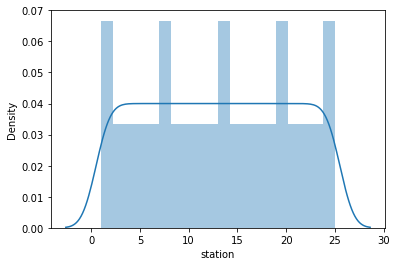

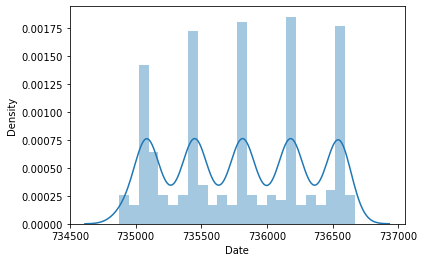

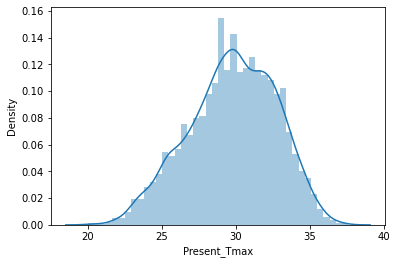

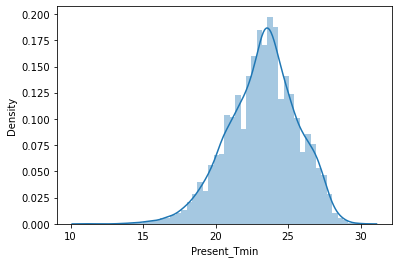

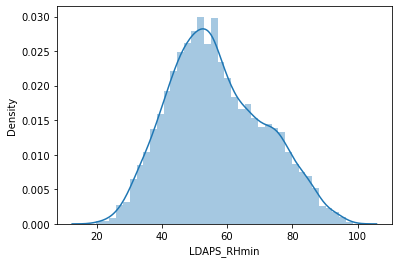

...

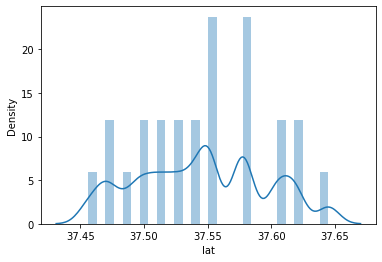

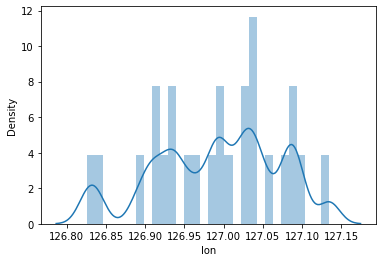

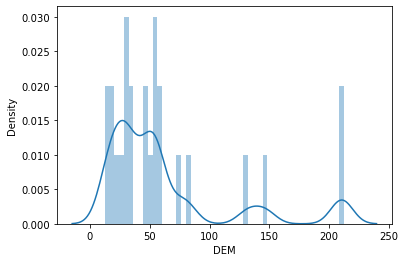

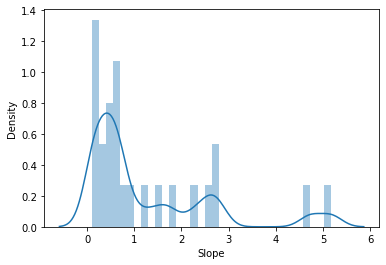

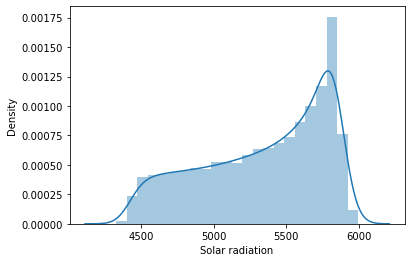

In [62]:
for val in x.columns:
    sns.distplot(x[val], kde=True)
    plt.show()

- Skewness removed

#### Checking for outlier and removal

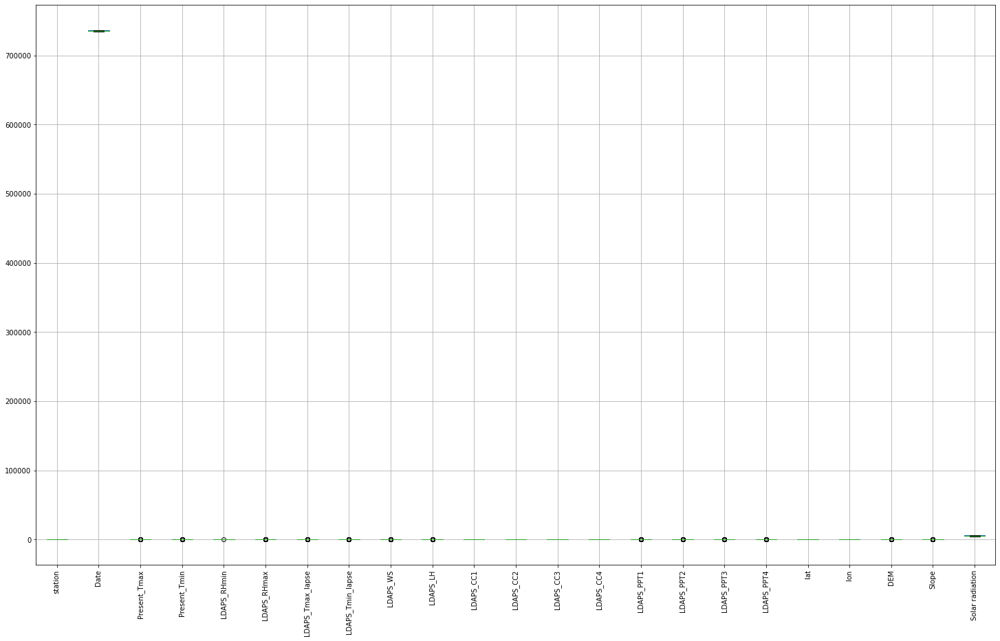

In [63]:
x.boxplot(figsize = [25,15])
plt.xticks(rotation=90)
plt.show()

###### No possible outliers to remove

#### Apply scaling

In [64]:
#scaling standardize the model thus the prediction come out with accuracy
from sklearn.preprocessing import MinMaxScaler

scale = MinMaxScaler()

new = scale.fit(x)
new_model = new.transform(x)



##### scaled 


In [65]:
#reassigning x
x = new_model

# finding the best random state

In [66]:

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
maxAccu = 0
maxRS = 0
for i in range(1,1000):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = i)
    LR = LinearRegression()
    LR.fit(x_train, y_train)
    predf = LR.predict(x_test)
    acc = r2_score(y_test, predf)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print("Best accuracy is: ", maxAccu, " on Random State ", maxRS)

Best accuracy is:  0.8227288837241269  on Random State  535


# Test-Train Split

In [68]:
#train test split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = 535)

In [69]:
# printing the shape of train test split data
print(x_test.shape)
print(y_test.shape)
print(x_train.shape)
print(y_train.shape)

(1550, 23)
(1550, 2)
(6200, 23)
(6200, 2)


# Finding the best algorithm

In [70]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
#from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

In [71]:
model = [LinearRegression(), RandomForestRegressor(), DecisionTreeRegressor()]

In [72]:
for m in model:
    m.fit(x_train,y_train)
    predm=m.predict(x_test)
    print(r2_score(y_test,predm))
    print('error')
    print("Mean absolute error: ", mean_absolute_error(y_test,predm))
    print("Mean squared error: ", mean_squared_error(y_test,predm))
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, predm)))
    print("\n")

0.8227288837241269
error
Mean absolute error:  0.9350988720051461
Mean squared error:  1.5116514850868168
Root Mean Squared Error: 1.2294923688607493


0.9101847834942262
error
Mean absolute error:  0.6411583870967741
Mean squared error:  0.7445257667741934
Root Mean Squared Error: 0.8628590654180979


0.7922320388208317
error
Mean absolute error:  0.9571612903225797
Mean squared error:  1.7311096774193557
Root Mean Squared Error: 1.3157164122330296




In [73]:
#RandomforestRegressor
from sklearn.ensemble import RandomForestRegressor
RFR = RandomForestRegressor(n_estimators=100)
RFR.fit(x_train,y_train)
predrfr = RFR.predict(x_test)
print(r2_score(y_test,predrfr))

print('error')
print("Mean absolute error: ", mean_absolute_error(y_test,predrfr))
print("Mean squared error: ", mean_squared_error(y_test,predrfr))
print('Root Mean Squared Error: ', np.sqrt(mean_squared_error(y_test, predrfr)))

0.9099633888867771
error
Mean absolute error:  0.6433970967741939
Mean squared error:  0.745731373225806
Root Mean Squared Error:  0.8635573942858725


#### Cross-validation

In [74]:
lr = LinearRegression()
rf = RandomForestRegressor()
dt = DecisionTreeRegressor()

In [75]:
cross = [lr,rf,dt]

from sklearn.model_selection import cross_val_score
for vl in cross:
    scr = cross_val_score(vl, x, y, cv=8)
    print("The cross validation score of model :", scr.mean())

The cross validation score of model : 0.7990417036877794
The cross validation score of model : 0.9053240657698829
The cross validation score of model : 0.7768237032675004


### Observation

- The best model is Random forest regressor with 
   - Accuracy score   : 91%
   - Cross_validation accuracy score : 91%

# Hyper parameter tuning

In [76]:
#import the randomized search CV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

In [77]:
param = {"max_depth": [3,None],
         "max_features": sp_randint(1, x_train.shape[1]),
         "min_samples_split": sp_randint(2, 11),
         "n_estimators":(50, 100)}

In [78]:
RCV = RandomizedSearchCV(RandomForestRegressor(), param, cv=5)

In [79]:
RCV.fit(x_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                   param_distributions={'max_depth': [3, None],
                                        'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000002A757C24610>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000002A757C24250>,
                                        'n_estimators': (50, 100)})

In [80]:
RCV.best_params_

{'max_depth': None,
 'max_features': 5,
 'min_samples_split': 5,
 'n_estimators': 100}

In [81]:
RCV_pred = RCV.best_estimator_.predict(x_test)

In [82]:
r2_score(y_test, RCV_pred)

0.9137834227845001

# Saving the model

In [83]:
import joblib
import pickle

joblib.dump(RCV.best_estimator_, "temprfr.pkl")
filename = 'temprfr.pkl'
pickle.dump(RCV,open(filename, 'wb'))
load = pickle.load(open(filename, 'rb'))
load.predict(x_test)

array([[28.63811548, 23.96706508],
       [21.00225628, 16.66265354],
       [27.98879145, 23.58574838],
       ...,
       [25.68585278, 20.02223413],
       [32.86750437, 22.25265119],
       [29.92329286, 22.61300238]])

In [90]:
df2 = pd.DataFrame(RCV_pred, columns=["predicted_Next_Tmax","predicted_Next_Tmin"])

In [91]:
df2

,predicted_Next_Tmax,predicted_Next_Tmin
0,28.638115,23.967065
1,21.002256,16.662654
2,27.988791,23.585748
3,31.631931,23.176577
4,32.048453,24.761525
...,...,...
1545,28.639423,20.716743
1546,32.623265,24.295703
1547,25.685853,20.022234
1548,32.867504,22.252651


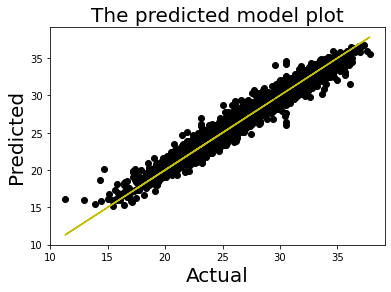

In [92]:
plt.scatter(x=y_test, y=predrfr, color = "black")
plt.plot(y_test,y_test, color='y')
plt.xlabel("Actual", fontsize =20)
plt.ylabel("Predicted", fontsize=20)
plt.title("The predicted model plot", fontsize=20)
plt.show()